In [1]:
import numpy as np 
from astropy.io import ascii

import matplotlib.pyplot as plt

# read in syn and obs stars

## Mist stars

In [2]:
synm=np.load("sample/mist.npy")
idx = np.isfinite(synm["mass"]) & np.isfinite(synm["logg"]) & np.isfinite(synm["Teff"])
synm = synm[idx]

# correct dnu by applying correction factor
from fdnu import asfgrid

evstate=np.zeros((synm["feh"].shape[0],))+2
logz=synm["feh"]+np.log10(0.019)
teff=synm["Teff"]
mass = synm["mass"]
logg = synm["logg"]
s=asfgrid.Seism(datadir="fdnu/")
dnu, numax, fdnu = s.get_dnu_numax(evstate,logz,teff,mass,mass,logg)
synm["delta_nu"] = dnu
synm["nu_max"] = numax

idx = synm["phase"]==3
xmst, ymst, ymstt = synm["nu_max"][idx], synm["nu_max"][idx]**0.75/synm["delta_nu"][idx], synm["delta_nu"][idx]
Nmst = xmst.shape[0]

outside interp range 3078  out of  16764


## Padova stars

In [3]:
import ebf
synp=ebf.read("sample/kepler_galaxia_mrtd5.ebf")
Nstar = synp["alpha"].shape[0]
factor = int(Nstar/16000)
idx = np.arange(0,int(Nstar/factor))*factor
for key in synp.keys():
    synp[key] = synp[key][idx]
print(synp.keys())

idx = synp["evstate"]==2
xpdv, ypdv, ypdvt = synp["numax"][idx], synp["numax"][idx]**0.75/synp["dnu"][idx], synp["dnu"][idx]
Npdv = xpdv.shape[0]

dict_keys(['vb', 'exbv_solar', 'campaign', 'sdss_g', 'mag2', 'mag1', 'mag0', 'tmass_j', 'kepler_ke', 'tmass_h', 'kepler_ddo51', 'log_teff', 'vr', 'radius', 'sobject_id', 'satid', 'pmra', 'vx', 'vy', 'sdss_z', 'label', 'e_numax', 'vz', 'pdf_orig', 'insurvey', 'vrgc', 'evstate', 'mtip', 'stlogg', 'pz', 'px', 'py', 'exbv_schlegel', 'feh', 'log_age', 'dnu', 'pmdec', 'rgc', 'ra', 'tess_te', 'sdss_i', 'tmass_id', 'log_grav', 'lum', 'exbv_schlegel_inf', 'pm', 'vlgc', 'kappa_r', 'mact', 'glon', 'lgc', 'dnu_scaling', 'popid', 'meh', 'numax', 'rad', 'glat', 'stteff', 'alpha', 'vl', 'partid', 'kappa_m', 'gaia_grp', 'stlogz', 'tmass_ks', 'e_dnu', 'data_name', 'circ_id', 'pzgc', 'sdss_r', 'gaia_g', 'prob', 'mu', 'giant_class', 'sradius', 'weights', 'gaia_gbp', 'alpha_fe', 'sdss_go', 'smass', 'dec', 'fieldid', 'vzgc', 'stradius'])


## Obs stars

In [4]:
yu=ascii.read("sample/yu+2018.csv")
idx = (yu["Phase"]==2)
xobs, yobs, yobst = yu["numax"][idx], yu["numax"][idx]**0.75/yu["Delnu"][idx], yu["Delnu"][idx]
Nobs = xobs.shape[0]

# import the edge

In [5]:
edge = np.load("sample/edge_nike.npy")
xedge, yedge = edge[:,0], edge[:,1]
yedget = xedge**0.75/yedge
Nedge = xedge.shape[0]

import scipy
tck = np.load("sample/spline.npy",allow_pickle=True)
idx_left = xobs<=10.0**scipy.interpolate.splev(np.log10(yobs), tck, der=0)
idx_right = xobs>10.0**scipy.interpolate.splev(np.log10(yobs), tck, der=0)
idx_mrich = yu["[Fe/H]"][idx]>=0
idx_mpoor = yu["[Fe/H]"][idx]<0

# Compare RC stars on the two diagrams
## Nike diagram

/Users/yaguang/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:33: RuntimeWarning: invalid value encountered in greater


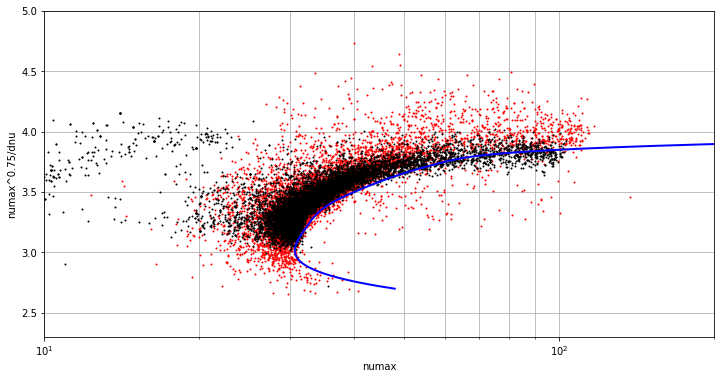

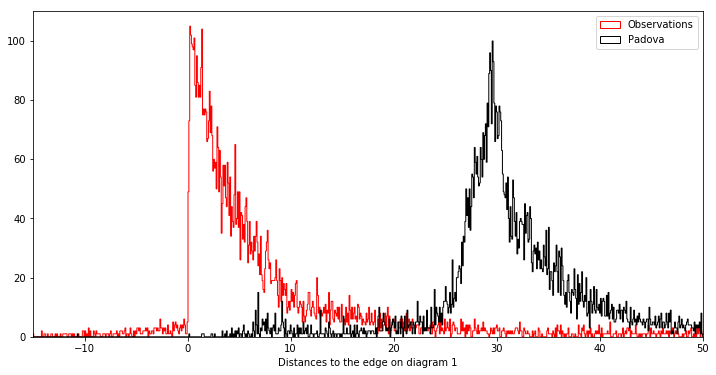

In [6]:
fig = plt.figure(figsize=(12,6))
axes = fig.add_subplot(111)
axes.axis([10, 200, 2.3, 5.0])
axes.set_xscale("log")

# plot observations
axes.plot(xobs, yobs, "r.", markersize=2)
axes.grid(which="both")
axes.set_xlabel("numax")
axes.set_ylabel("numax^0.75/dnu")

# plot edge
axes.plot(xedge, yedge, "b-", linewidth=2, zorder=10) 

# plot models - padova
axes.plot(xpdv, ypdv, "k.", markersize=2)

# shortest distance distribution
X = np.zeros((Nobs+Nedge, 2))
X[0:Nobs,0], X[0:Nobs,1] = xobs, yobs
X[Nobs:,0], X[Nobs:,1] = xedge, yedge
Y = scipy.spatial.distance.pdist(X)
sdist=Y[0:Nobs]
idx_right = xobs>10.0**scipy.interpolate.splev(np.log10(yobs), tck, der=0)
sdist[idx_right]=-sdist[idx_right]

# shortest distance distribution for models
X = np.zeros((Npdv+Nedge, 2))
X[0:Npdv,0], X[0:Npdv,1] = xpdv, ypdv
X[Npdv:,0], X[Npdv:,1] = xedge, yedge
Y = scipy.spatial.distance.pdist(X)
sdistp=Y[0:Npdv]
idx_right = xpdv>10.0**scipy.interpolate.splev(np.log10(ypdv), tck, der=0)
sdistp[idx_right]=-sdistp[idx_right]

fig = plt.figure(figsize=(12,6))
axes = fig.add_subplot(111)
axes.set_xlim(-15, 50)
bins0 = np.linspace(sdist.min(),50, 1500)
h=axes.hist(sdist, color="red", histtype="step", label="Observations",bins=bins0, zorder=0)
h=axes.hist(sdistp, color="black", histtype="step", label="Padova",bins=bins0, zorder=0)
axes.set_xlabel("Distances to the edge on diagram 1")
axes.legend()


# Dnu-numax diagram

/Users/yaguang/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in greater


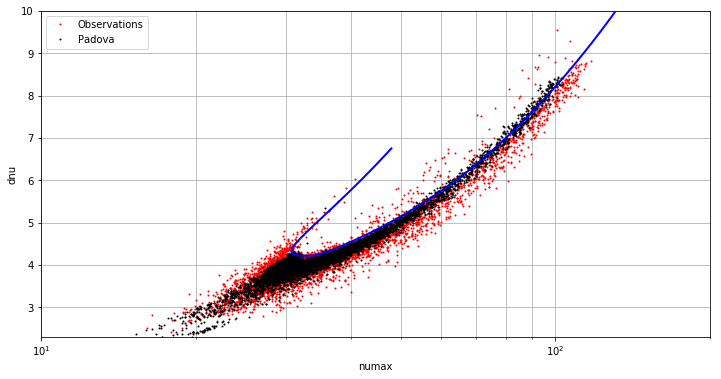

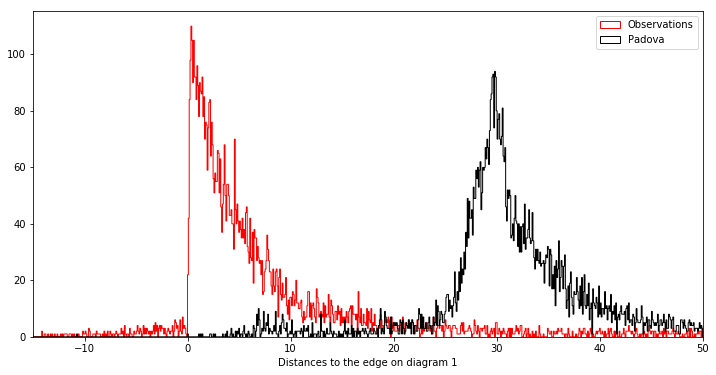

In [7]:
fig = plt.figure(figsize=(12,6))
axes = fig.add_subplot(111)
axes.axis([10, 200, 2.3, 10.0])
axes.set_xscale("log")

# plot observations
axes.plot(xobs, yobst, "r.", label="Observations", markersize=2)
axes.grid(which="both")
axes.set_xlabel("numax")
axes.set_ylabel("dnu")

# plot edge
axes.plot(xedge, yedget, "b-", linewidth=2, zorder=10) 

# plot models - padova
axes.plot(xpdv, ypdvt, "k.", label="Padova", markersize=2)
axes.legend()


# shortest distance distribution
X = np.zeros((Nobs+Nedge, 2))
X[0:Nobs,0], X[0:Nobs,1] = xobs, yobst
X[Nobs:,0], X[Nobs:,1] = xedge, yedget
Y = scipy.spatial.distance.pdist(X)
sdist=Y[0:Nobs]
idx_right = xobs>10.0**scipy.interpolate.splev(np.log10(yobs), tck, der=0)
sdist[idx_right]=-sdist[idx_right]

# shortest distance distribution for models
X = np.zeros((Npdv+Nedge, 2))
X[0:Npdv,0], X[0:Npdv,1] = xpdv, ypdvt
X[Npdv:,0], X[Npdv:,1] = xedge, yedget
Y = scipy.spatial.distance.pdist(X)
sdistp=Y[0:Npdv]
idx_right = xpdv>10.0**scipy.interpolate.splev(np.log10(ypdv), tck, der=0)
sdistp[idx_right]=-sdistp[idx_right]

fig = plt.figure(figsize=(12,6))
axes = fig.add_subplot(111)
axes.set_xlim(-15, 50)
bins0 = np.linspace(sdist.min(),50, 1500)
h=axes.hist(sdist, color="red", histtype="step", label="Observations",bins=bins0, zorder=0)
h=axes.hist(sdistp, color="black", histtype="step", label="Padova",bins=bins0, zorder=0)
axes.set_xlabel("Distances to the edge on diagram 1")
axes.legend()


# Plot in delta_nu bins

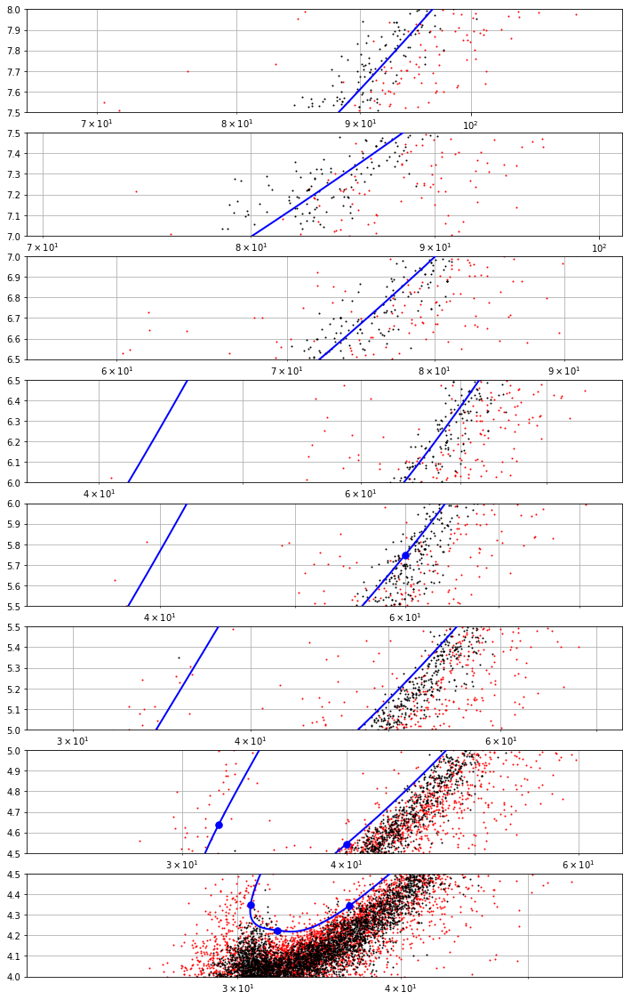

In [8]:
dnu_llim = np.arange(4, 8.0, 0.5)
dnu_ulim = dnu_llim+0.5

# points
points=[(32, 2.9), (30.7, 3.0), (32.2, 3.2), (36.5, 3.42), (40, 3.5), (60, 3.75), (100, 3.85), (112, 3.86)]
Npoint = len(points)
xpoint, ypoint = np.array([points[i][0] for i in range(Npoint)]), np.array([points[i][1] for i in range(Npoint)])

fig = plt.figure(figsize=(12,20))
axes = fig.subplots(nrows=dnu_llim.shape[0], ncols=1)[::-1]
for iax in range(dnu_llim.shape[0]):
    axes[iax].set_ylim(dnu_llim[iax], dnu_ulim[iax])
    riax = (yobst>=dnu_llim[iax]) & (yobst<dnu_ulim[iax])
    z = xobs[riax]
    axes[iax].set_xlim(z.min()-5, z.max()+5)
    axes[iax].set_xscale("log")

    axes[iax].plot(xobs, yobst, "r.", markersize=2)
    axes[iax].grid(which="both")
    # axes.set_xlabel("numax")
    # axes.set_ylabel("dnu")

    # plot edge
    axes[iax].plot(xedge, yedget, "b-", linewidth=2, zorder=10) 

    # plot models - padova
    axes[iax].plot(xpdv, ypdvt, "k.", markersize=2)

    # plot points
    axes[iax].plot(xpoint, xpoint**0.75/ypoint, "b.", markersize=15)



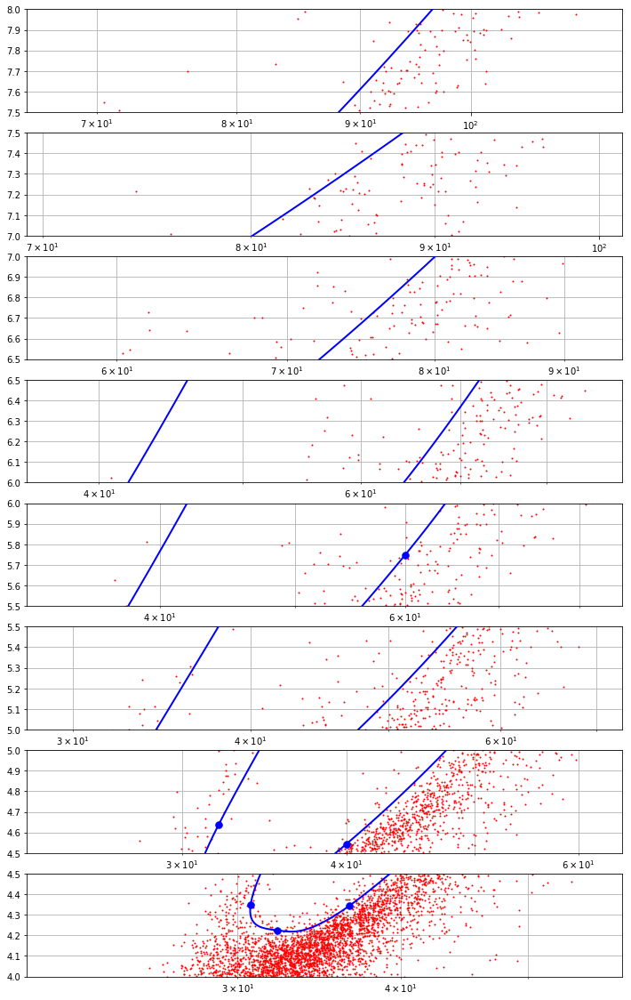

In [9]:
dnu_llim = np.arange(4, 8.0, 0.5)
dnu_ulim = dnu_llim+0.5

# points
points=[(32, 2.9), (30.7, 3.0), (32.2, 3.2), (36.5, 3.42), (40, 3.5), (60, 3.75), (100, 3.85), (112, 3.86)]
Npoint = len(points)
xpoint, ypoint = np.array([points[i][0] for i in range(Npoint)]), np.array([points[i][1] for i in range(Npoint)])

fig = plt.figure(figsize=(12,20))
axes = fig.subplots(nrows=dnu_llim.shape[0], ncols=1)[::-1]
for iax in range(dnu_llim.shape[0]):
    axes[iax].set_ylim(dnu_llim[iax], dnu_ulim[iax])
    riax = (yobst>=dnu_llim[iax]) & (yobst<dnu_ulim[iax])
    z = xobs[riax]
    axes[iax].set_xlim(z.min()-5, z.max()+5)
    axes[iax].set_xscale("log")

    axes[iax].plot(xobs, yobst, "r.", markersize=2)
    axes[iax].grid(which="both")
    # axes.set_xlabel("numax")
    # axes.set_ylabel("dnu")

    # plot edge
    axes[iax].plot(xedge, yedget, "b-", linewidth=2, zorder=10) 

    # plot models - padova
    # axes[iax].plot(xpdv, ypdvt, "k.", markersize=2)

    # plot points
    axes[iax].plot(xpoint, xpoint**0.75/ypoint, "b.", markersize=15)



In [10]:
x=35.5
y=3.35
x**0.75/y

4.341366570413256

In [11]:
x=35.5
y=3.35
x**0.75/y

4.341366570413256

## Find a metric to quatify the similarity of two distributions


/Users/yaguang/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in greater
  app.launch_new_instance()


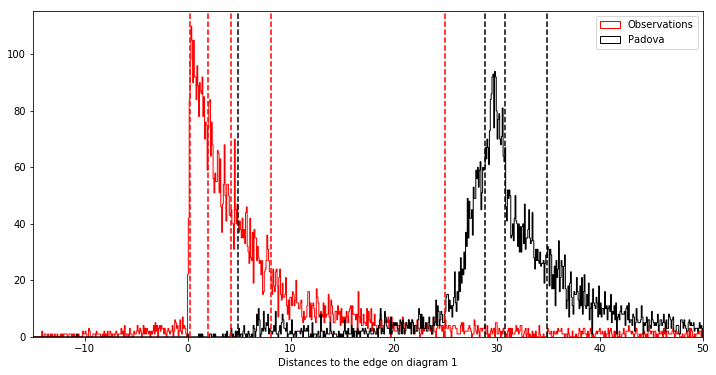

In [22]:
# shortest distance distribution
X = np.zeros((Nobs+Nedge, 2))
X[0:Nobs,0], X[0:Nobs,1] = xobs, yobst
X[Nobs:,0], X[Nobs:,1] = xedge, yedget
Y = scipy.spatial.distance.pdist(X)
sdist=Y[0:Nobs]
idx_right = xobs>10.0**scipy.interpolate.splev(np.log10(yobs), tck, der=0)
sdist[idx_right]=-sdist[idx_right]

# shortest distance distribution for models
X = np.zeros((Npdv+Nedge, 2))
X[0:Npdv,0], X[0:Npdv,1] = xpdv, ypdvt
X[Npdv:,0], X[Npdv:,1] = xedge, yedget
Y = scipy.spatial.distance.pdist(X)
sdistp=Y[0:Npdv]
idx_right = xpdv>10.0**scipy.interpolate.splev(np.log10(ypdv), tck, der=0)
sdistp[idx_right]=-sdistp[idx_right]

qs = np.array([5, 30, 50, 70, 90])
qobs = np.nanpercentile(sdist, qs) 
qpdv = np.nanpercentile(sdistp, qs)

fig = plt.figure(figsize=(12,6))
axes = fig.add_subplot(111)
axes.set_xlim(-15, 50)
bins0 = np.linspace(sdist.min(),50, 1500)
h=axes.hist(sdist, color="red", histtype="step", label="Observations",bins=bins0, zorder=0)
h=axes.hist(sdistp, color="black", histtype="step", label="Padova",bins=bins0, zorder=0)
for q in qobs:
    axes.axvline(q, color="red", linestyle="--")
for q in qpdv:
    axes.axvline(q, color="black", linestyle="--")
axes.set_xlabel("Distances to the edge on diagram 1")
axes.legend()


In [15]:
qobs

array([ 0.50454674,  2.01559146,  4.25265304,  8.05345777, 25.03159178])

In [20]:
qpdv

4

Rewrite fnumax as a function of mass first
$f_{\nu_{\rm max}}=\alpha(g/g_{\odot})^\beta$,
and the numax predicted from stellar models is
$\nu_{\rm max} = f_{\nu_{\rm max}} * g/T_{\rm eff} = \alpha(g/g_{\odot})^\beta g/T_{\rm eff}$.


/Users/yaguang/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in greater
/Users/yaguang/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/Users/yaguang/anaconda/lib/python3.6/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))
enabling Ensemble sampler.
start burning in. nburn: 1000
[##############################]
start iterating. nsteps: 2000
[##############################]WARNING:root:Too few points to create valid contours
[##############################]
Mean acceptance fraction: 0.000


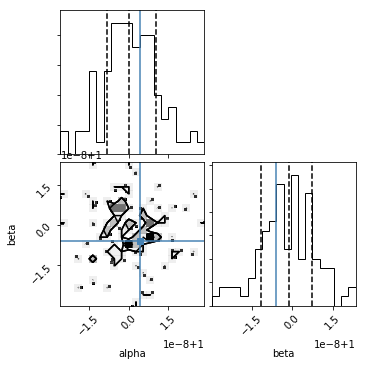

In [38]:
tck

array([array([0.462398  , 0.462398  , 0.462398  , 0.462398  , 0.50514998,
       0.53402611, 0.54406804, 0.57403127, 0.5865873 , 0.5865873 ,
       0.5865873 , 0.5865873 ]),
       array([1.50514998, 1.47185542, 1.50367366, 1.5336102 , 1.62887711,
       1.71690269, 1.85274303, 2.04921802, 0.        , 0.        ,
       0.        , 0.        ]),
       3], dtype=object)